## Trump vs Biden in the Media

* Visualise then analyse
* Start with some simple form of sentiment analysis (tf-idf or similar)

In [94]:
from string import punctuation
from collections import Counter
from itertools import * 
import sys
sys.path.append(r"..\..\..\my_modules")
import pandas as pd
import pickle as pkl
from nltk.corpus import stopwords
import time
from random import randint
import requests
import json
stop_words = set(stopwords.words('english'))

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [96]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from gensim.utils import simple_preprocess
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

In [97]:
# could get the Mcloughlin list??
twitter_neg_words = requests.get(r'https://raw.githubusercontent.com/jeffreybreen/twitter-sentiment-analysis-tutorial-201107/master/data/opinion-lexicon-English/negative-words.txt')
twitter_pos_words = requests.get(r'https://raw.githubusercontent.com/jeffreybreen/twitter-sentiment-analysis-tutorial-201107/master/data/opinion-lexicon-English/positive-words.txt')

neg_terms, pos_terms = twitter_neg_words.text, twitter_pos_words.text
neg_words, pos_words = neg_terms.split('\n')[35:], pos_terms.split('\n')[35:]

In [98]:
class cnn_scraper:
    """Contains all of the code required to perform scrape of CNN for a given key_term"""
    def __init__(self, key_term):
        self.key_term = key_term
        self.results = []
        self.page, self.from_, self.length = 0, 0, 100
    
    def scrape(self):
        still_articles = True
        while still_articles: 
            keyword = self.key_term
            url = 'https://search.api.cnn.io/content?size=100&q=' + self.key_term + '&from=' + str(self.from_) + '&page=' + str(self.page)
            r = requests.get(url)
            result = json.loads(r.content)['result']
            length = len(result)
            self.results.extend(result)
            if length == 0:
                still_articles = False
            print(self.page, length, len(self.results), end="\t")
            self.page+=1
            self.from_+=100    
            time.sleep(randint(1,2)/10)
        
    def read(self):
        results_df = pd.DataFrame(self.results)
        self.results_df = results_df
        
    def write(self, path):
        self.results_df.to_excel(path + '.xlsx')
    
    def save(self,path):
        pkl.dump(self.results_df,open(path + '.pkl','wb'))

    def run(self, path):
        self.scrape()
        self.read()
        self.write(path)
        self.save(path)

In [99]:
#tesla_cnn = cnn_scraper('tesla')
#tesla_cnn.run(r'C:\Users\User\Documents\Notes\tesla_cnn')
trump = cnn_scraper('trump')
trump.run(r'C:\Users\User\Documents\Notes\trump_cnn')

0 50 50	1 50 100	2 50 150	3 50 200	4 50 250	5 50 300	6 50 350	7 50 400	8 50 450	9 50 500	10 50 550	11 50 600	12 50 650	13 50 700	14 50 750	15 50 800	16 50 850	17 50 900	18 50 950	19 50 1000	20 50 1050	21 50 1100	22 50 1150	23 50 1200	24 50 1250	25 50 1300	26 50 1350	27 50 1400	28 50 1450	29 50 1500	30 50 1550	31 50 1600	32 50 1650	33 50 1700	34 50 1750	35 50 1800	36 50 1850	37 50 1900	38 50 1950	39 50 2000	40 50 2050	41 50 2100	42 50 2150	43 50 2200	44 50 2250	45 50 2300	46 50 2350	47 50 2400	48 50 2450	49 50 2500	50 50 2550	51 50 2600	52 50 2650	53 50 2700	54 50 2750	55 50 2800	56 50 2850	57 50 2900	58 50 2950	59 50 3000	60 50 3050	61 50 3100	62 50 3150	63 50 3200	64 50 3250	65 50 3300	66 50 3350	67 50 3400	68 50 3450	69 50 3500	70 50 3550	71 50 3600	72 50 3650	73 50 3700	74 50 3750	75 50 3800	76 50 3850	77 50 3900	78 50 3950	79 50 4000	80 50 4050	81 50 4100	82 50 4150	83 50 4200	84 50 4250	85 50 4300	86 50 4350	87 50 4400	88 50 4450	89 50 4500	90 50 4550	91 50 4600	92 50 4650	93 50 4

KeyboardInterrupt: 

In [ ]:
def create_sentiment_dict(raw_text):
    pos_dict, neg_dict = {},{}
    for punc in punctuation:                                                                                                     
        raw_text = raw_text.replace(punc, "").lower()   
    tokens = (raw_text.split( ))
    tokens = [token for token in tokens if token not in set(stop_words)]
    pos_included, neg_included = set(tokens) & set(pos_words), set(tokens) & set(neg_words) # think this significantly increases efficiency
    for token in tokens:
        if token in set(pos_included): #sets enable faster lookup than lists
            pos_dict[token] = pos_dict.get(token,0) + 1
        if token in set(neg_included): 
            neg_dict[token] = neg_dict.get(token,0) + 1
    count_subjective = sum(pos_dict.values()) + sum(neg_dict.values())
    f = lambda x: x / count_subjective
    pos_freq = {k: f(v) for k, v in pos_dict.items()}
    neg_freq = {k: f(v) for k, v in neg_dict.items()}
    return pos_freq, neg_freq

trump.read()
text = trump.results_df
start = time.perf_counter()
text_counted = text['body'].apply(create_sentiment_dict)
end = time.perf_counter()

In [86]:
def format_dataframe(df):
    tesla_split = text_counted.apply(pd.Series)
    results = pd.concat([tesla_split[0].apply(pd.Series),tesla_split[1].apply(pd.Series)],axis=1)
    results_df = results.fillna(0)
    dated = pd.merge(text['firstPublishDate'], results_df, left_index = True, right_index = True)
    return dated

dated = format_dataframe(text_counted)
dated.head(5)

,firstPublishDate,flexible,work,best,flexibility,support,darling,well,worked,leads,...,casualty,frost,creep,narrower,insolvent,useless,pessimism,grumpy,prohibitive,weariness
0,2020-12-11T23:22:54Z,0.083333,0.250000,0.083333,0.083333,0.083333,0.083333,0.083333,0.00000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2020-12-11T15:39:50Z,0.000000,0.023810,0.000000,0.000000,0.000000,0.000000,0.000000,0.02381,0.011905,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2020-12-11T11:49:28Z,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037037,0.00000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2020-12-10T01:07:47Z,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2020-12-08T15:08:15.306Z,0.000000,0.020833,0.000000,0.000000,0.000000,0.000000,0.020833,0.00000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
def transform_df(dated):
    animate_df = dated.groupby('firstPublishDate').mean()
    animate_df['firstPublishDate'] = animate_df.index
    melted_df = animate_df.melt(id_vars = ['firstPublishDate'])

    df = melted_df
    df.rename(columns={'variable':'name'},inplace=True)

    df['firstPublishDate'] = pd.to_datetime(df['firstPublishDate']).apply(lambda x: x.date) # strip the time component
    df['pos/neg'] = df['name'].isin(pos_words).map({True:'#99FFFF',False:'#FF0000'})

    df = melted_df
    df.rename({'variable':'name'},inplace=True)
    return df

df = transform_df(dated)

In [89]:
#fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(date):
    dff = df[df['firstPublishDate'].eq(date)].sort_values(by='value', ascending=True).tail(20)
    ax.clear()
    ax.barh(dff['name'], dff['value']*100, color=dff['pos/neg'], alpha = 0.5)#)
    dx = dff['value'].max() / 200
    for i, (value, name) in enumerate(zip(dff['value'], dff['name'])):
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value-dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    ax.text(1, 0, str(date)[:10], transform=ax.transAxes, color='#777777', size=46, ha='right', va='bottom', weight=800)
    ax.text(0, 1.06, 'Daily Count', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.set_facecolor('w')
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.13, 'Evolution of language during the coronavirus crisis',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    _ = plt.box(False)
    
#draw_barchart('2020-10-01')

In [91]:
from datetime import date, timedelta

sdate = pd.to_datetime('2020-01-01') #date(2020, 1, 1).tz_convert(None)   # start date
edate = pd.to_datetime('2020-12-01') #date(2020, 12, 1).tz_convert(None)   # end date

delta = edate - sdate       # as timedelta

day_list = []
for i in range(delta.days + 1):
    day = sdate + timedelta(days=i)
    day = pd.Timestamp(day)
    day_list.append(day)

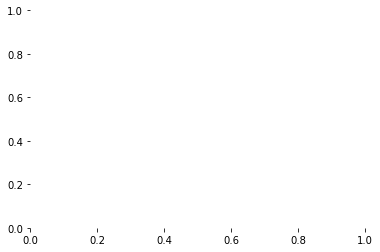

In [92]:
fig, ax = plt.subplots(figsize=(15, 10))
animator = animation.FuncAnimation(fig, draw_barchart, frames=day_list)
HTML(animator.to_jshtml())

In [157]:
negative = corona_df.apply(pd.Series)[0].apply(Counter).sum(axis=0)
positive = corona_df.apply(pd.Series)[1].apply(Counter).sum(axis=0)

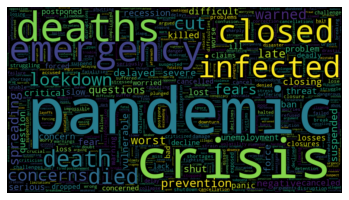

In [158]:
wordcloud = WordCloud(width=900,height=500, max_words=1628,relative_scaling=1,normalize_plurals=False).generate_from_frequencies(negative)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [170]:
def return_tagged_documents(list_of_documents, tokens_only = False):
    '''Given a list of documents this function returns a list of pre_processed (list of words), tagged documents'''
    for i, line in enumerate(list_of_documents):
        tokens = simple_preprocess(line)
        if tokens_only:
            yield tokens
        else:
            # For training training_data, add tags
            yield TaggedDocument(tokens, [i])

train_corpus = list(return_tagged_documents(corona['Text'].values))